In [16]:
import typing
import io
import os

import torch
import numpy as np
!pip install opencv-python
import cv2
import matplotlib.pyplot as plt

from urllib.request import urlretrieve

from PIL import Image
from torchvision import transforms

from models.modeling import VisionTransformer, CONFIGS

In [17]:
os.makedirs("attention_data", exist_ok=True)
if not os.path.isfile("attention_data/ilsvrc2012_wordnet_lemmas.txt"):
    urlretrieve("https://storage.googleapis.com/bit_models/ilsvrc2012_wordnet_lemmas.txt", "attention_data/ilsvrc2012_wordnet_lemmas.txt")
if not os.path.isfile("attention_data/ViT-B_16-224.npz"):
    urlretrieve("https://storage.googleapis.com/vit_models/imagenet21k+imagenet2012/ViT-B_16-224.npz", "attention_data/ViT-B_16-224.npz")

imagenet_labels = dict(enumerate(open('attention_data/ilsvrc2012_wordnet_lemmas.txt')))

In [33]:
# Test Image
# img_url = "https://media.wired.com/photos/5dd593a829b9c40008b179b3/191:100/w_2338,h_1224,c_limit/Cul-BabyYoda_mandalorian-thechild-1_af408bfd.jpg"
img_url = "https://s3.amazonaws.com/cdn-origin-etr.akc.org/wp-content/uploads/2017/11/14112506/Pembroke-Welsh-Corgi-standing-outdoors-in-the-fall.jpg"
# img_url = "https://wwwimage-us.pplusstatic.com/thumbnails/photos/w1920-q80/marquee/1042093/osw_sp_hero_landscape.jpg"
# img_url = "https://i.ytimg.com/vi/ShkF0ViMqOQ/maxresdefault.jpg"
# img_url = "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRpy4Ld3PhsWbM1as3DOxTwn2bYgXAHKcMYxR9I08N0zKB6jwD23pv9gUackx0eXvVtecc&usqp=CAU"
# img_url = "https://image.shutterstock.com/image-vector/a1-text-logo-design-vector-260nw-1872822664.jpg"
# img_url = "https://www.rover.com/blog/wp-content/uploads/2019/03/white-cat-4025572_1920.jpg" # Cat
# img_url = "https://s30379.pcdn.co/wp-content/uploads/2019/09/p1dfjorjqds6c9o21dre1ngs1p3j6.jpg"
# img_url = "https://cdn.the-scientist.com/assets/articleNo/36663/iImg/15248/d305ec2a-9f5a-4894-8cd3-a7c43bb0756b-brain-640.jpg"
# img_url = "https://static01.nyt.com/images/2018/12/04/science/04SCI-ZIMMER/merlin_147494628_a788760f-4209-40db-a0be-1305c3a661a6-superJumbo.jpg"
urlretrieve(img_url, "attention_data/img.jpg")

# Prepare Model
config = CONFIGS["ViT-B_16"]
model = VisionTransformer(config, num_classes=1000, zero_head=False, img_size=224, vis=True)
model.load_from(np.load("attention_data/ViT-B_16-224.npz"))
model.eval()

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
])
im = Image.open("attention_data/img.jpg")
x = transform(im)
x.size()

torch.Size([3, 224, 224])

In [36]:
logits, att_mat = model(x.unsqueeze(0))

att_mat = torch.stack(att_mat).squeeze(1)

def recursive_weight_mult(aug_att_mat):
    # Recursively multiply the weight matrices -- why?
    joint_attentions = torch.zeros(aug_att_mat.size())
    joint_attentions[0] = aug_att_mat[0]

    # print (aug_att_mat.size(0))
    for n in range(1, aug_att_mat.size(0)):
        joint_attentions[n] = torch.matmul(aug_att_mat[n], joint_attentions[n-1])
    return joint_attentions


# Get the outputs of individual attention heads separately
att_head_outputs = []
rec_weight_att_head_outputs = []
for i in range(12):
    att_head_outputs.append(att_mat[:, i, :, :])
    rec_weight_att_head_outputs.append(recursive_weight_mult(att_mat[:, i, :, :]))
    
# Average the attention weights across all heads.
att_mat = torch.mean(att_mat, dim=1)

print (att_mat.shape)

# To account for residual connections, we add an identity matrix to the
# attention matrix and re-normalize the weights.
# residual_att = torch.eye(att_mat.size(1))
# aug_att_mat = att_mat + residual_att
# aug_att_mat = aug_att_mat / aug_att_mat.sum(dim=-1).unsqueeze(-1)

print (aug_att_mat.shape)
# 12 in the shape is across depth and not across attention heads.


# joint_attentions = recursive_weight_mult(aug_att_mat)
joint_attentions = aug_att_mat

# Attention from the output token to the input space.
v = joint_attentions[-1]
grid_size = int(np.sqrt(aug_att_mat.size(-1)))
mask = v[0, 1:].reshape(grid_size, grid_size).detach().numpy()
mask = cv2.resize(mask / mask.max(), im.size)[..., np.newaxis]
result = (mask * im).astype("uint8")

torch.Size([12, 197, 197])
torch.Size([12, 197, 197])


Prediction Label and Attention Map!

0.63365 : Pembroke, Pembroke_Welsh_corgi
0.36313 : Cardigan, Cardigan_Welsh_corgi
0.00027 : basenji
0.00015 : dingo, warrigal, warragal, Canis_dingo
0.00009 : Shetland_sheepdog, Shetland_sheep_dog, Shetland


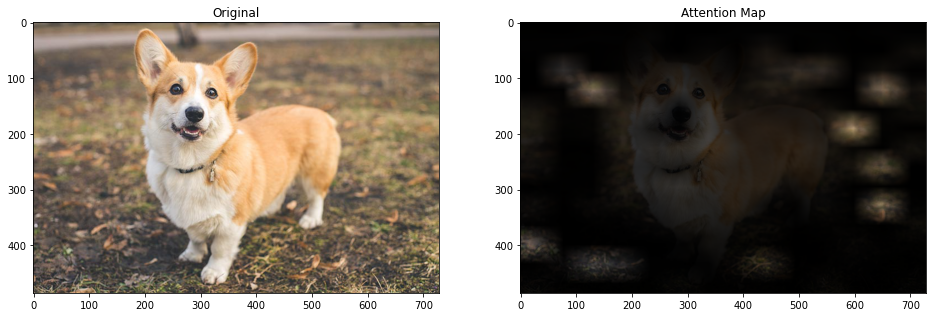

In [37]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))

ax1.set_title('Original')
ax2.set_title('Attention Map')
_ = ax1.imshow(im)
_ = ax2.imshow(result)

probs = torch.nn.Softmax(dim=-1)(logits)
top5 = torch.argsort(probs, dim=-1, descending=True)
print("Prediction Label and Attention Map!\n")
for idx in top5[0, :5]:
    print(f'{probs[0, idx.item()]:.5f} : {imagenet_labels[idx.item()]}', end='')

### Reference
* [attention_flow](https://github.com/samiraabnar/attention_flow)
* [vit-keras](https://github.com/faustomorales/vit-keras)

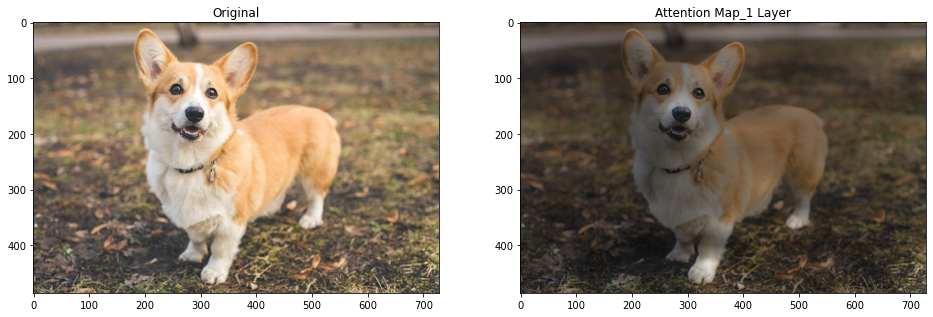

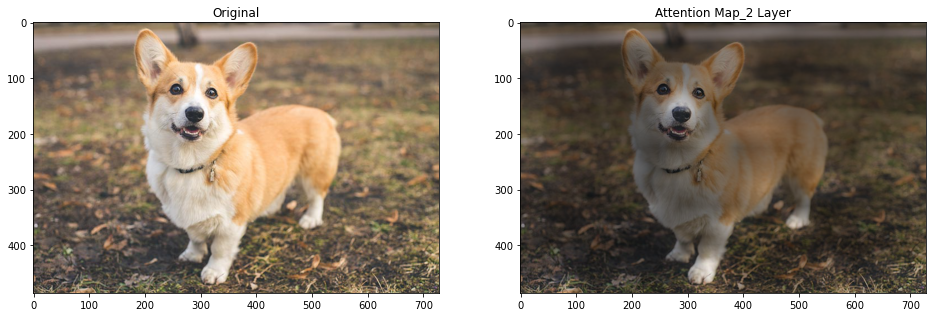

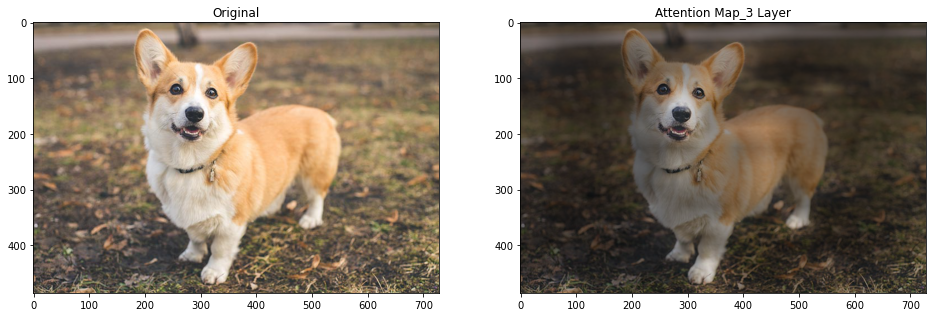

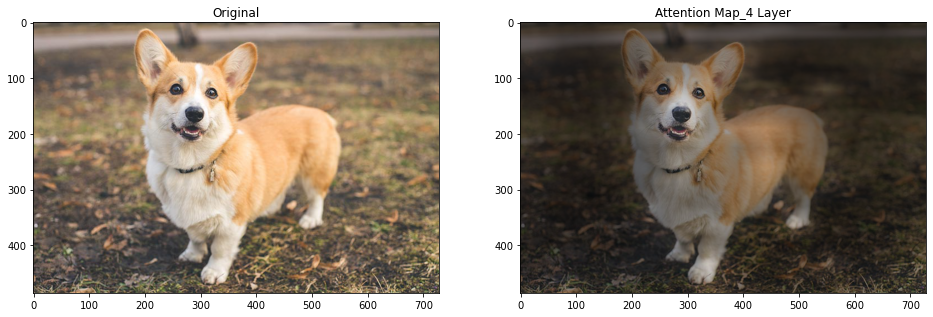

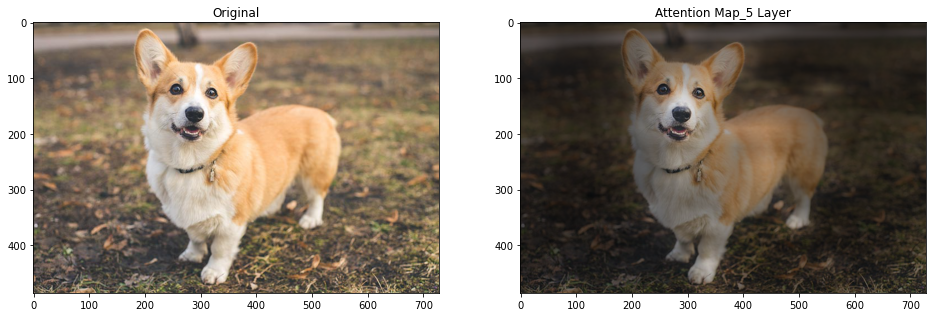

...

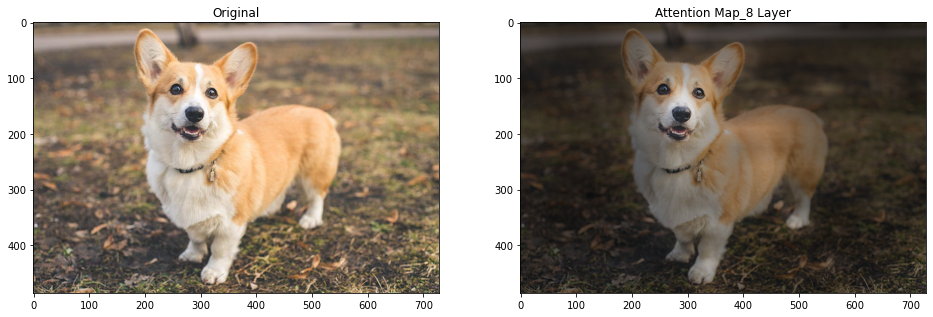

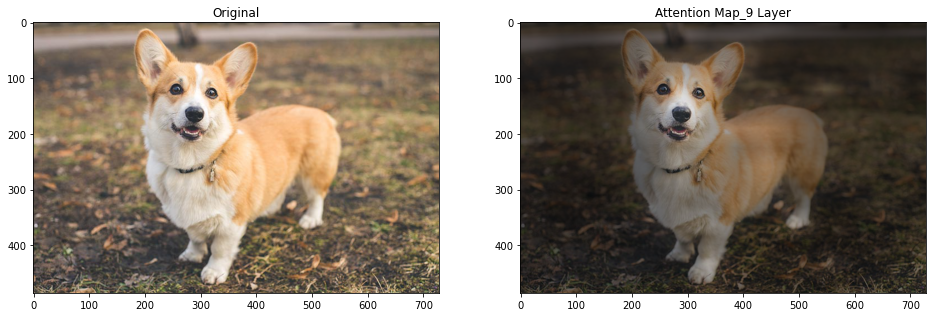

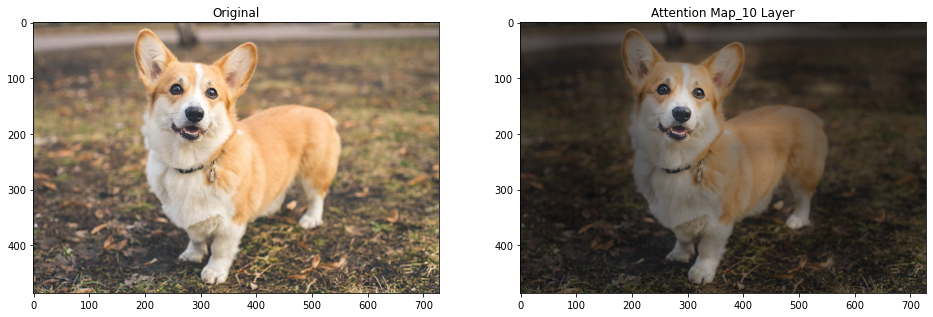

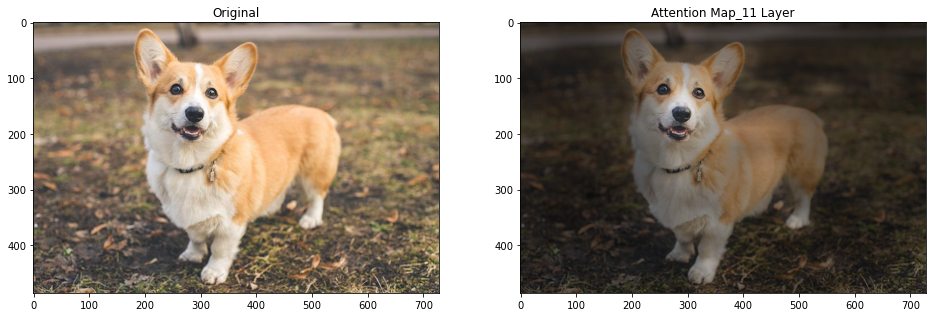

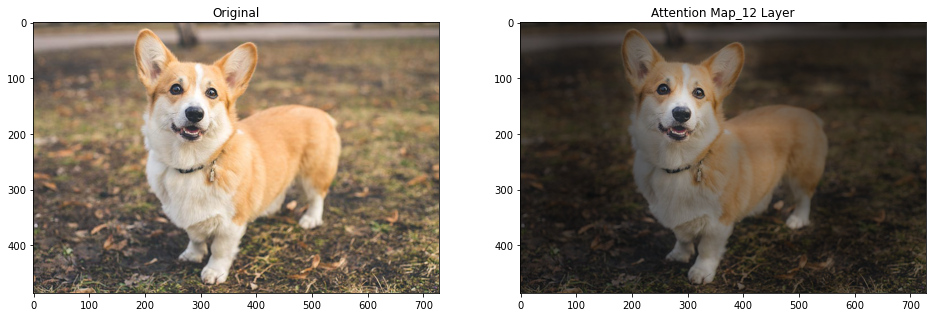

In [14]:
for i, v in enumerate(joint_attentions):
    # Attention from the output token to the input space.
    mask = v[0, 1:].reshape(grid_size, grid_size).detach().numpy()
    mask = cv2.resize(mask / mask.max(), im.size)[..., np.newaxis]
    result = (mask * im).astype("uint8")

    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))
    ax1.set_title('Original')
    ax2.set_title('Attention Map_%d Layer' % (i+1))
    _ = ax1.imshow(im)
    _ = ax2.imshow(result)

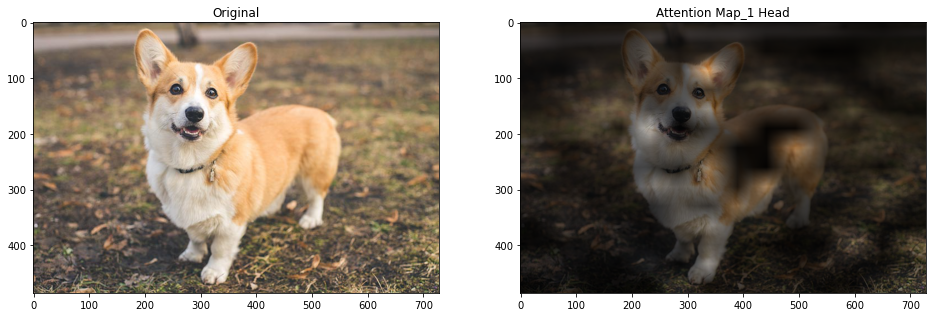

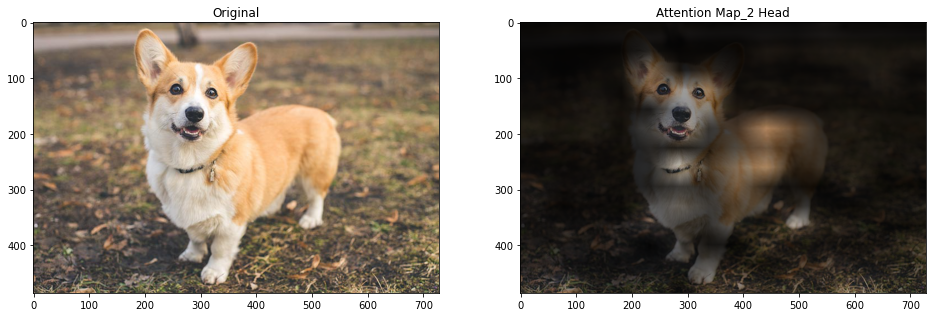

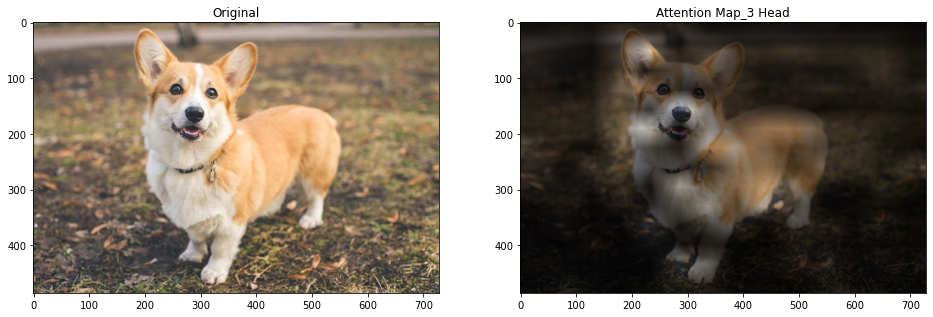

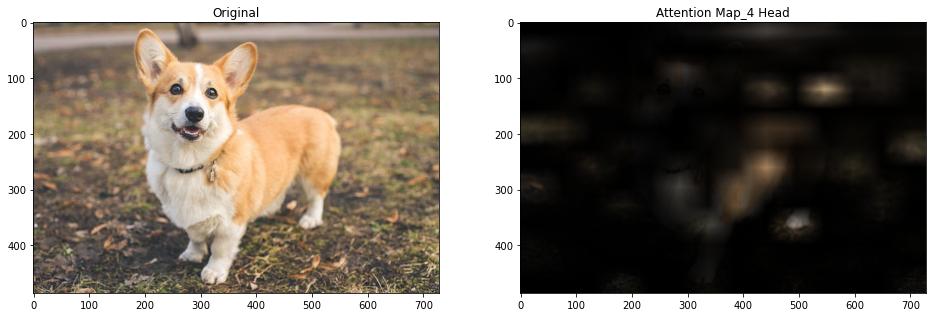

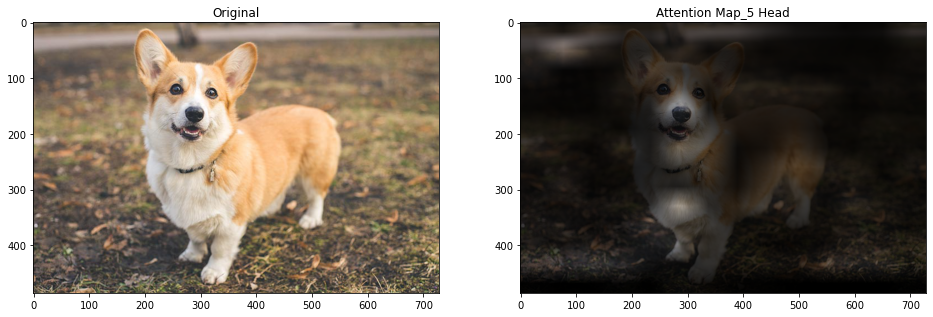

...

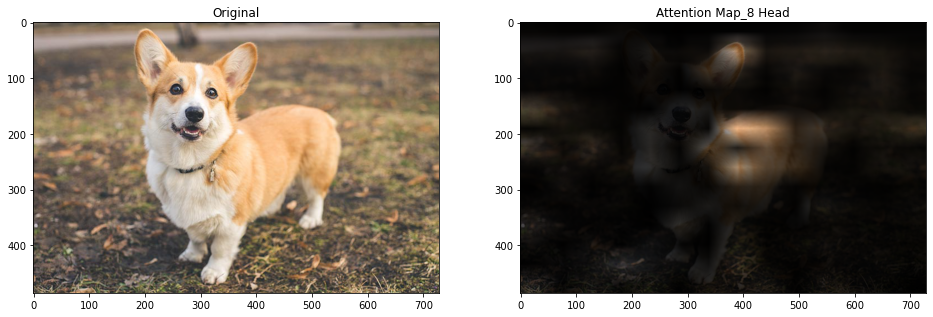

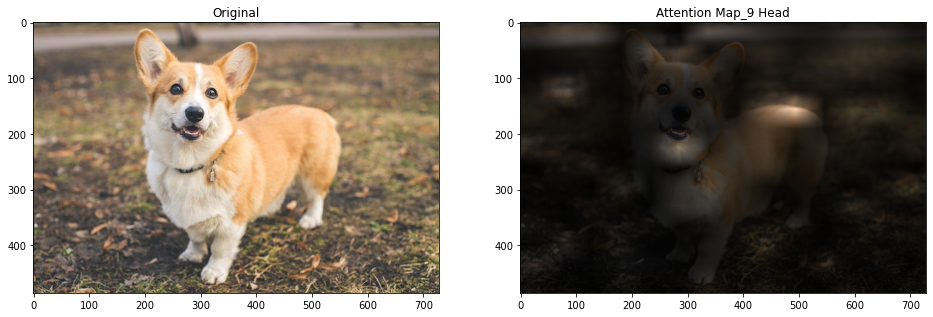

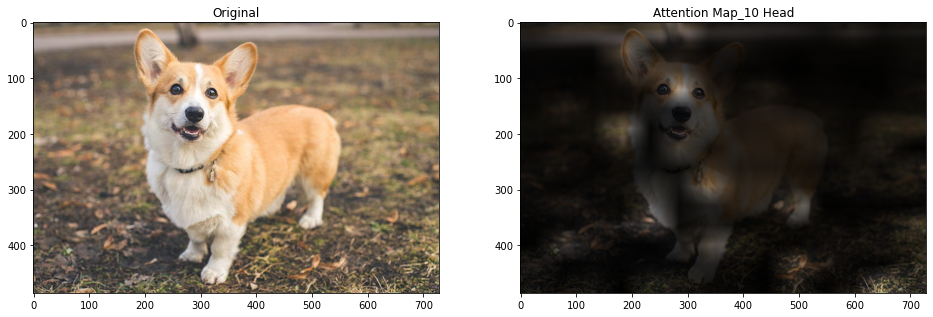

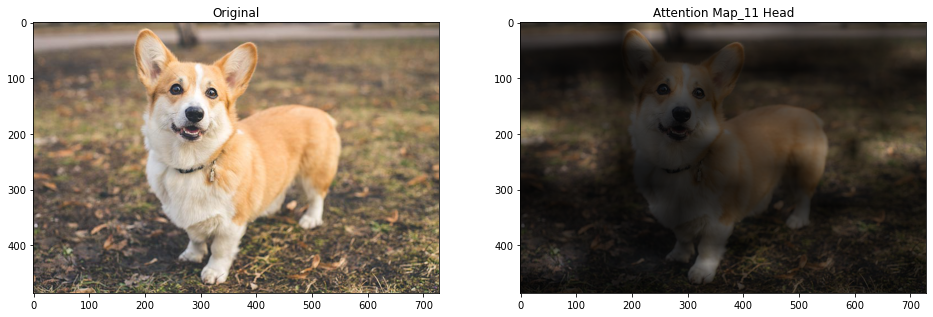

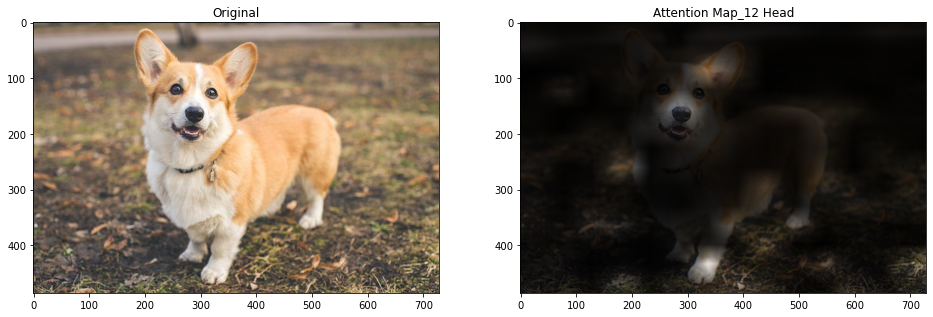

In [15]:
for i, v in enumerate(rec_weight_att_head_outputs):
    # Attention from the output token to the input space.
    v = v[-1]
    mask = v[0, 1:].reshape(grid_size, grid_size).detach().numpy()
    mask = cv2.resize(mask / mask.max(), im.size)[..., np.newaxis]
    result = (mask * im).astype("uint8")

    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))
    ax1.set_title('Original')
    ax2.set_title('Attention Map_%d Head' % (i+1))
    _ = ax1.imshow(im)
    _ = ax2.imshow(result)